In [3]:
import random
import os
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import json

In [15]:
def visualize_predictions(
    data: list[str],
    dataset_path: str,
    random_sample: int = 5,
    top_k_preds: int = 5,
):
    sampled_data = random.sample(data, min(random_sample, len(data)))

    for item in sampled_data:
        image_path = os.path.join(dataset_path, item["image_file"])
        if not os.path.exists(image_path):
            print(f"Image not found: {image_path}")
            continue

        image = Image.open(image_path).convert("RGB")

        pred = item["pred"]
        target = item["target"]

        pred_bboxes = pred.get("boxes", [])
        pred_scores = pred.get("scores", [])
        pred_labels = pred.get("labels", [])

        target_bboxes = target.get("boxes", [])
        target_labels = target.get("labels", [])

        # Sort predictions by score and take top_k
        if pred_bboxes and pred_scores:
            top_indices = sorted(range(len(pred_scores)), key=lambda i: pred_scores[i], reverse=True)[:top_k_preds]
            pred_bboxes = [pred_bboxes[i] for i in top_indices]
            pred_labels = [pred_labels[i] for i in top_indices]
            pred_scores = [pred_scores[i] for i in top_indices]

        # Plotting
        fig, ax = plt.subplots(1, figsize=(10, 10))
        ax.imshow(image)

        # Draw target boxes (blue)
        for bbox, label in zip(target_bboxes, target_labels):
            x1, y1, x2, y2 = bbox
            width, height = x2 - x1, y2 - y1
            rect = patches.Rectangle((x1, y1), width, height, linewidth=2, edgecolor='blue', facecolor='none')
            ax.add_patch(rect)
            ax.text(x1, y1 - 5, f"GT: {label}", color='blue', fontsize=10, weight='bold')

        # Draw predicted boxes (red)
        for bbox, label, score in zip(pred_bboxes, pred_labels, pred_scores):
            x1, y1, x2, y2 = bbox
            width, height = x2 - x1, y2 - y1
            rect = patches.Rectangle((x1, y1), width, height, linewidth=2, edgecolor='red', facecolor='none')
            ax.add_patch(rect)
            ax.text(x1, y1 + 12, f"Pred: {label} ({score:.2f})", color='red', fontsize=10, weight='bold')

        ax.set_title(f"Image: {item['image_file']}")
        plt.axis('off')
        plt.tight_layout()
        plt.show()

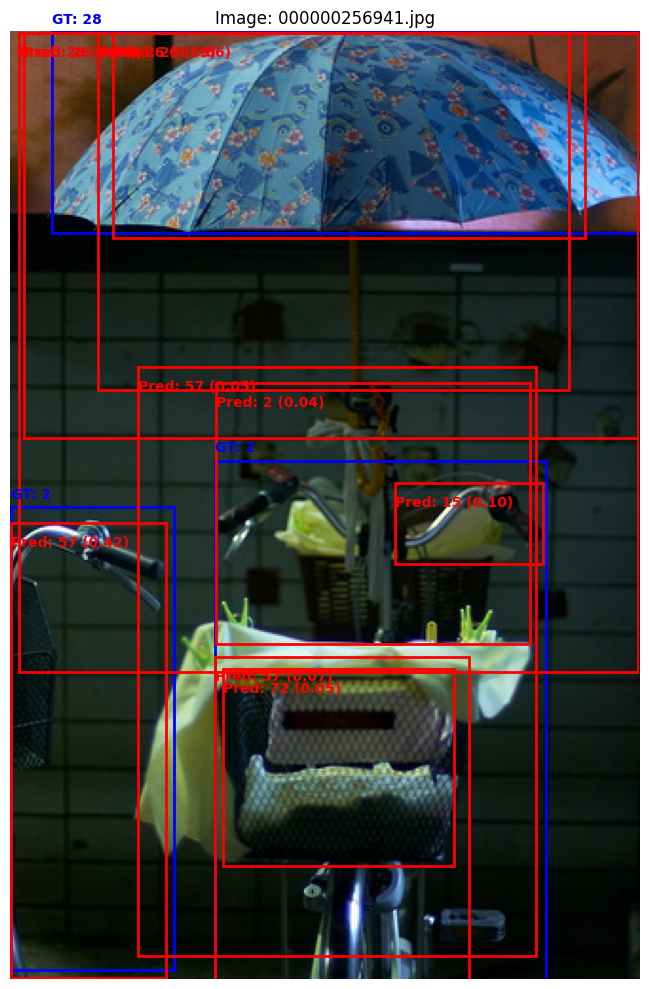

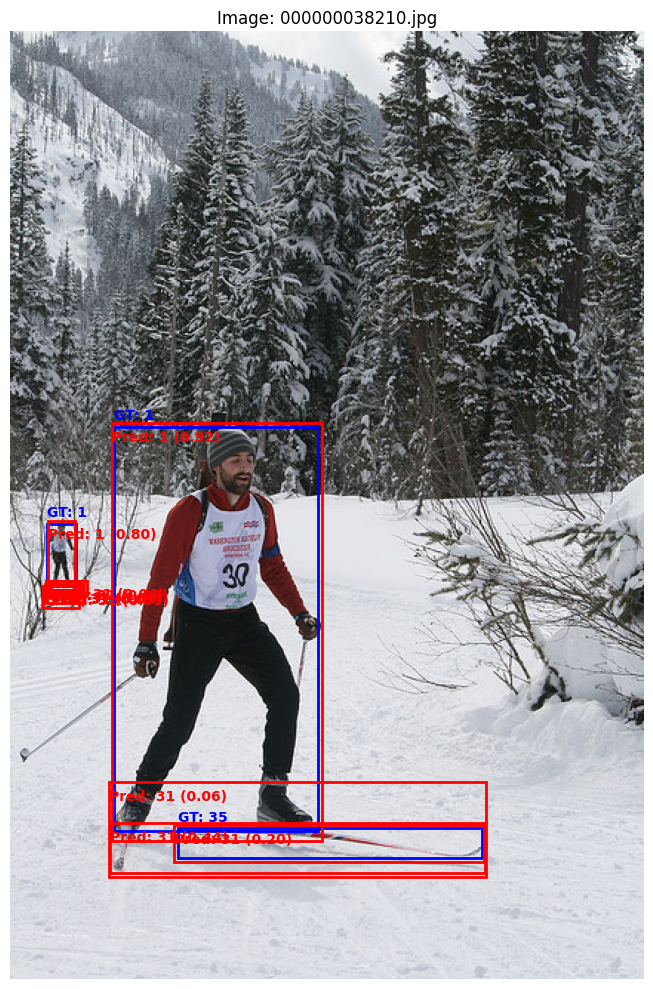

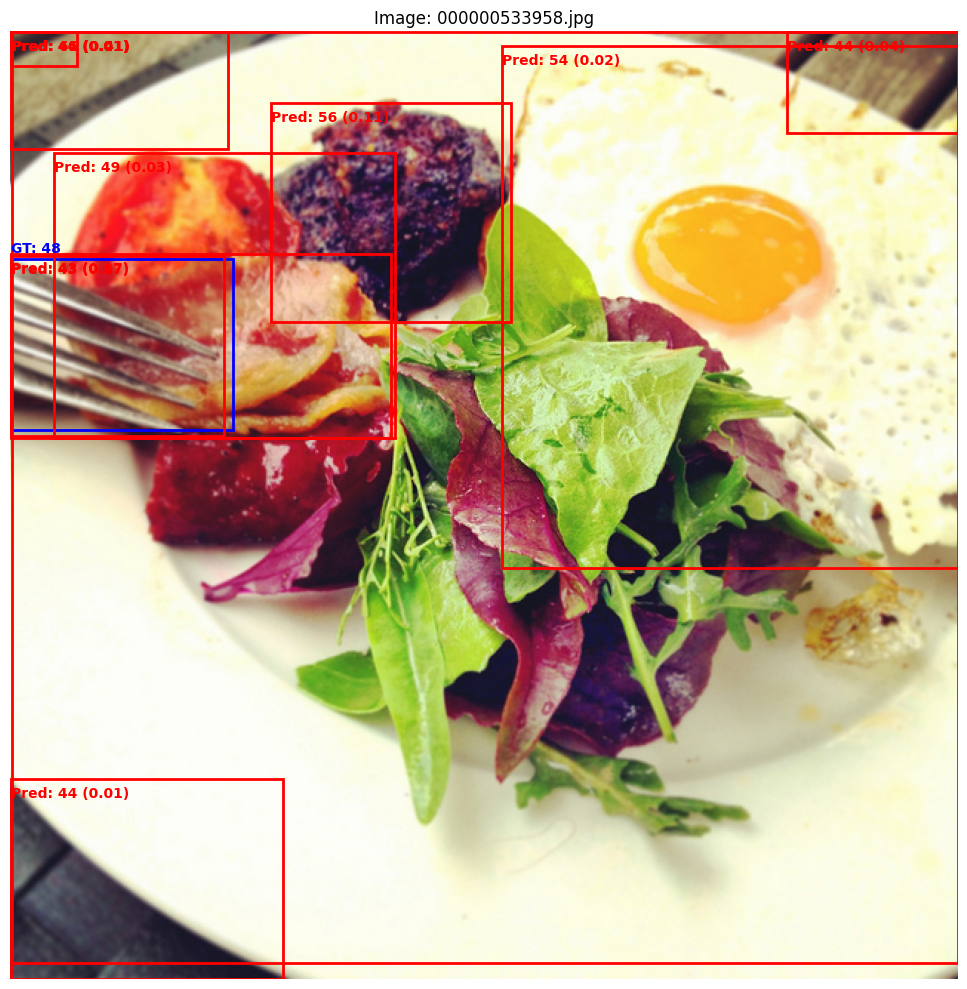

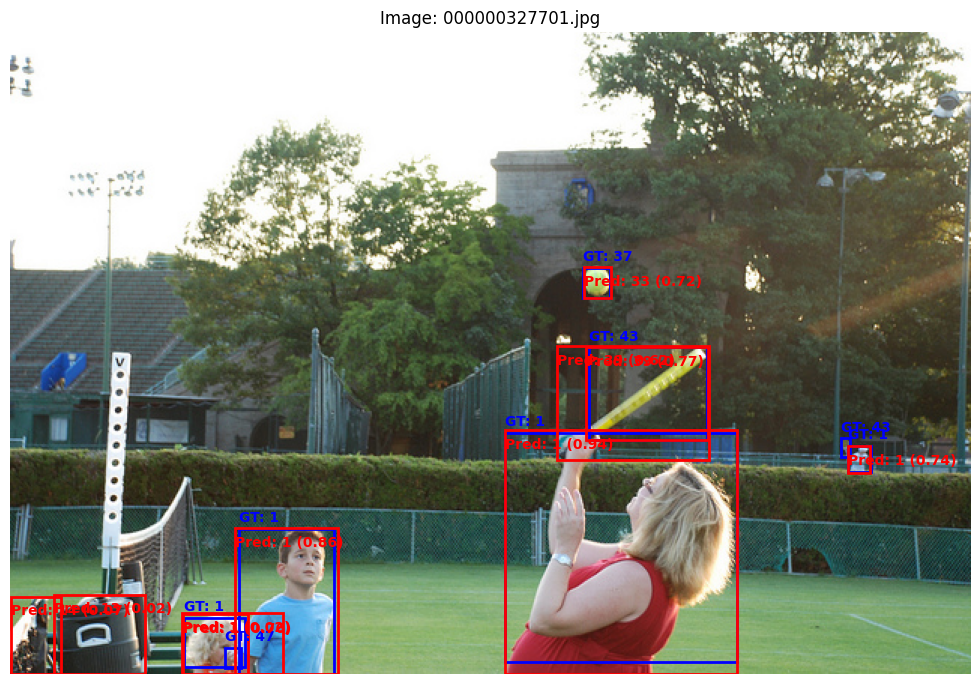

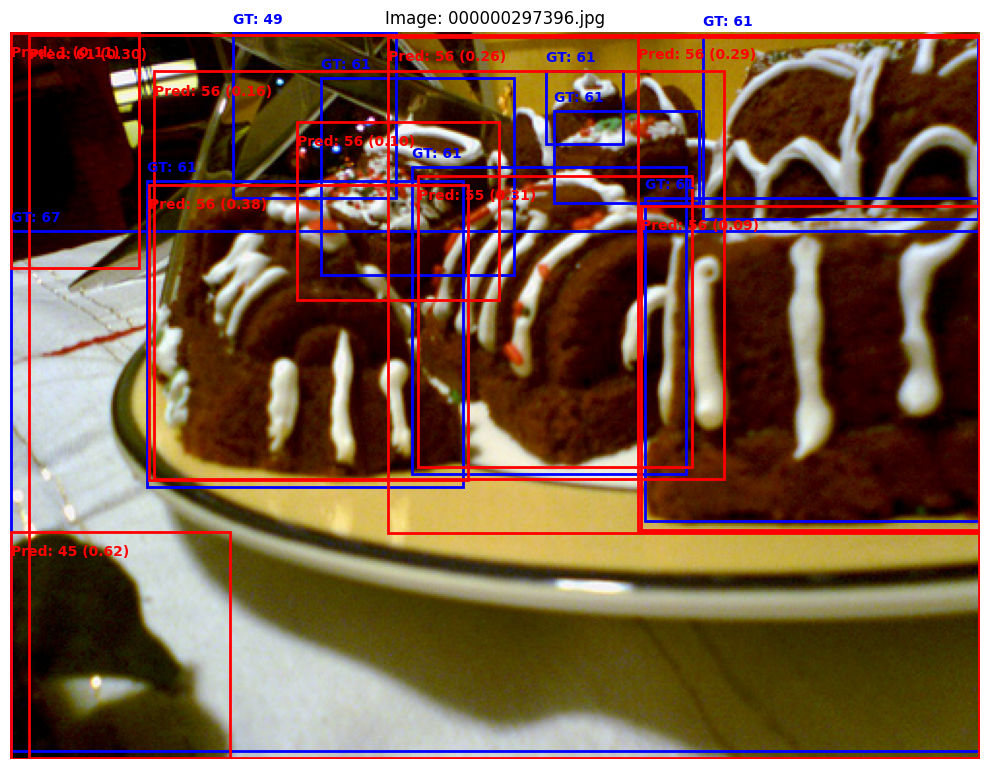

...

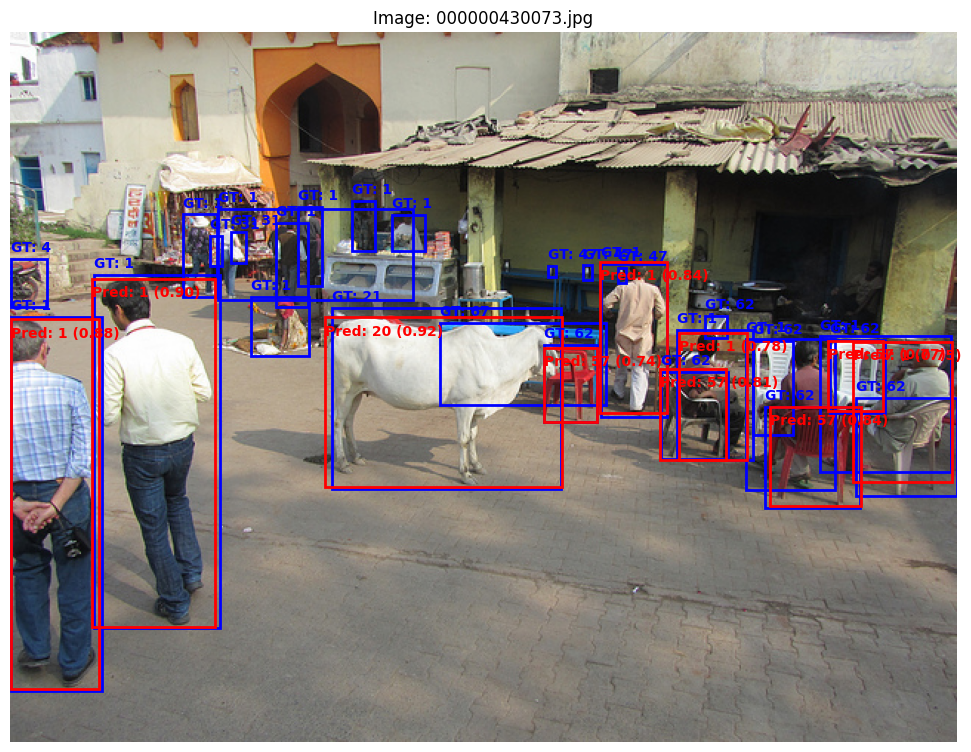

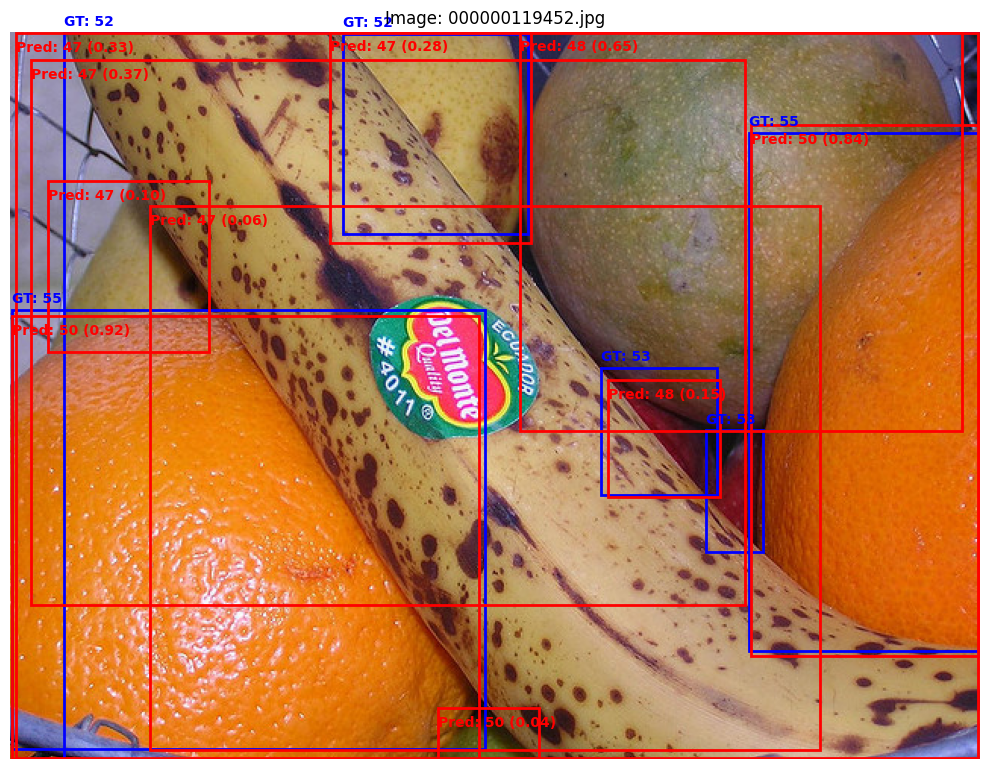

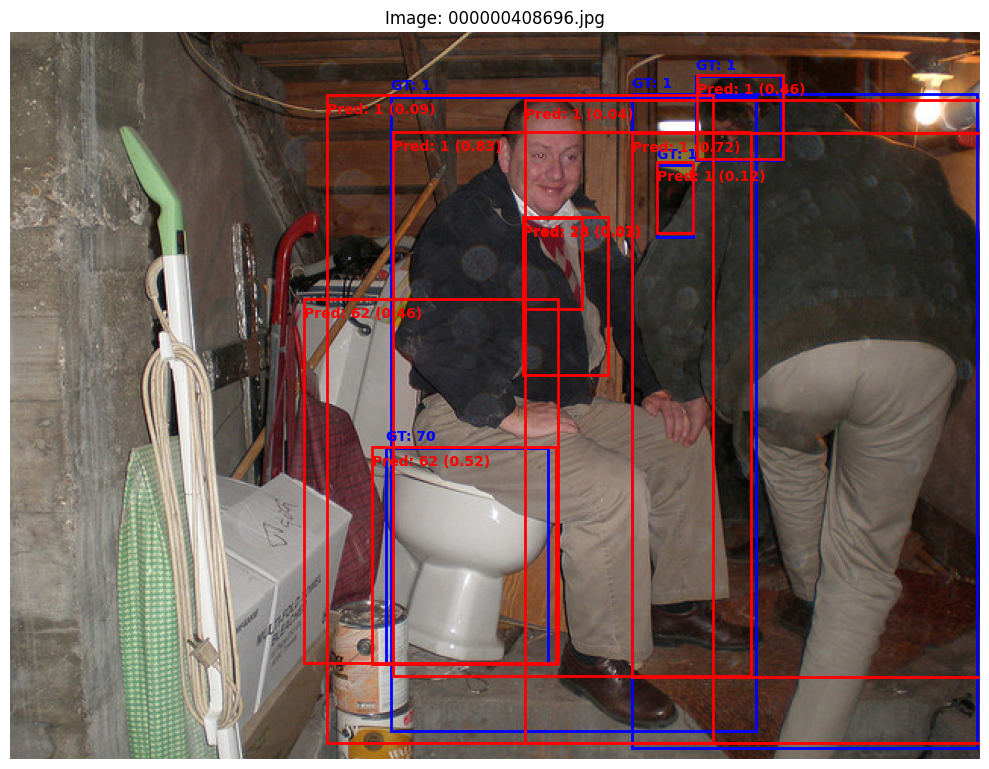

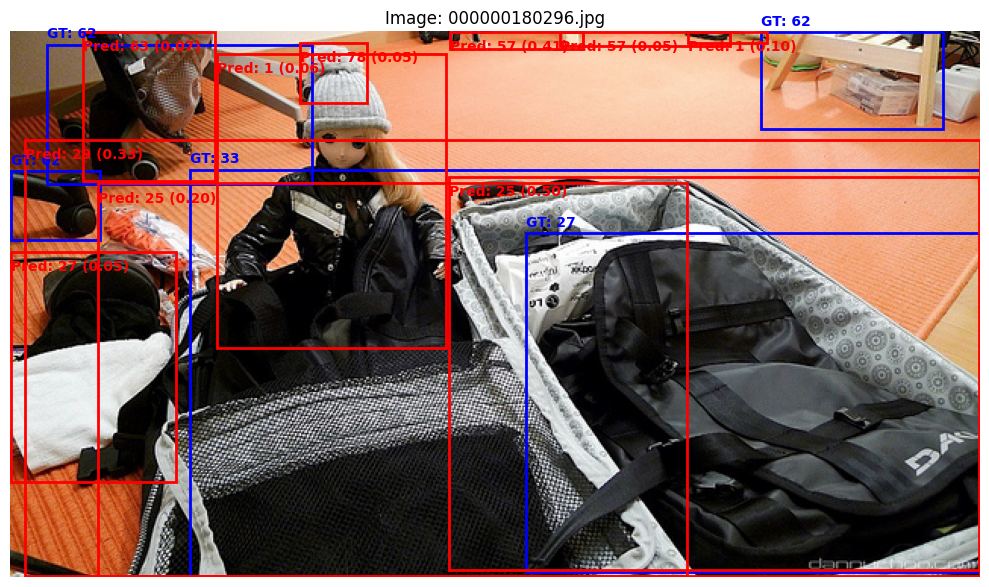

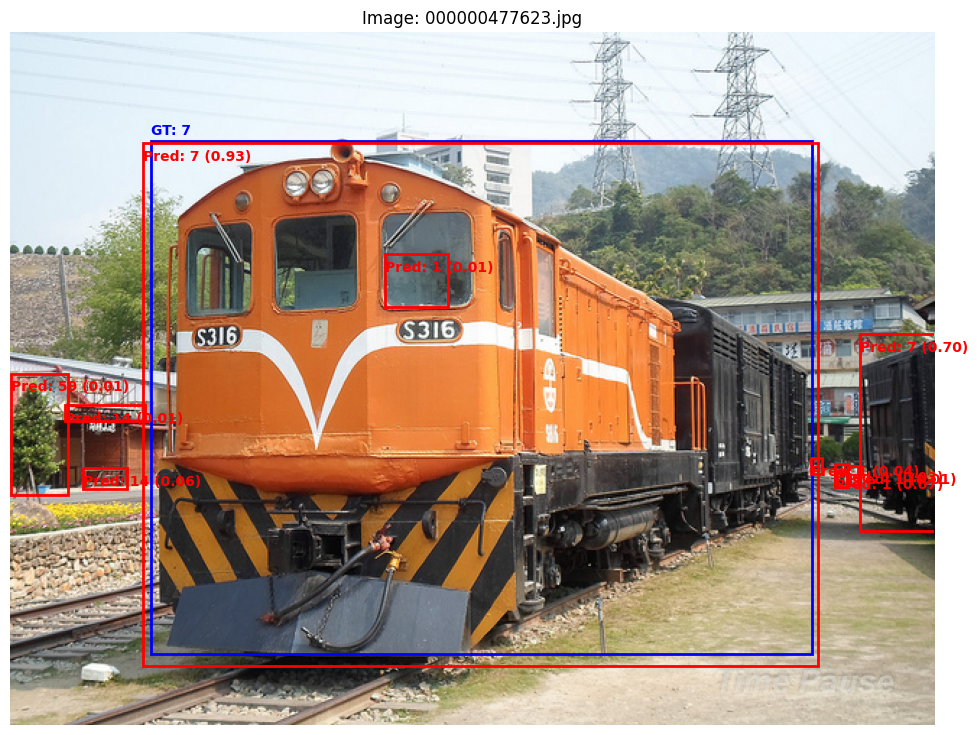

In [17]:
data_path = '../results/inference_results.json'

with open(data_path, 'r', encoding='utf-8') as f:
    data = json.load(f)

visualize_predictions(
    data,
    dataset_path='../datasets/val2017/',
    random_sample=15,
    top_k_preds=10
)